In [11]:
from utils import process_satellite_data_dir

directories = ['/home/jovyan/work/satellite_data/v1', '/home/jovyan/work/satellite_data/v2']
satellite_df = process_satellite_data_dir(directories)
print(satellite_df)


     Satellite Processing_Level Acquisition_DateTime Baseline_Number   
0          S2A           MSIL1C      20221113T104311           N0400  \
1          S2A           MSIL1C      20220809T102041           N0400   
2          S2A           MSIL1C      20220720T101611           N0400   
3          S2A           MSIL1C      20221114T101301           N0400   
4          S2B           MSIL1C      20220813T104629           N0400   
...        ...              ...                  ...             ...   
2455       S2B           MSIL1C      20220327T101629           N0400   
2456       S2B           MSIL1C      20211231T100319           N0301   
2457       S2A           MSIL2A      20220411T101601           N0400   
2458       S2A           MSIL1C      20220414T102601           N0400   
2459       S2B           MSIL2A      20220416T101559           N0400   

     Relative_Orbit Tile_Number Product_Discriminator    Month  
0              R008      T32ULA       20221113T141014  2022-11  
1    

In [12]:
value_counts = satellite_df['Tile_Number'].value_counts()

print(value_counts)

Tile_Number
T31UGU    50
T31UFP    50
T33UUA    48
T33UUP    47
T32ULC    46
          ..
T33UVR     9
T33UWS     8
T33TVN     8
T33UUR     7
T33UUS     6
Name: count, Length: 93, dtype: int64


Failed to load image: /home/jovyan/work/satellite_data/v1/S2B_MSIL2A_20220619T100029_N0400_R122_T33UWS_20220619T114329.tif
Failed to load image: /home/jovyan/work/satellite_data/v1/S2A_MSIL1C_20220627T100611_N0400_R022_T33UWS_20220627T134958.tif
Failed to load image: /home/jovyan/work/satellite_data/v1/S2B_MSIL1C_20220619T100029_N0400_R122_T33UWS_20220619T104419.tif
Failed to load image: /home/jovyan/work/satellite_data/v1/S2B_MSIL1C_20210326T100029_N0209_R122_T33UWS_20210326T120554.tif
Failed to load image: /home/jovyan/work/satellite_data/v1/S2B_MSIL1C_20210306T100029_N0209_R122_T33UWS_20210306T121335.tif
Failed to load image: /home/jovyan/work/satellite_data/v2/S2A_MSIL1C_20220724T100041_N0400_R122_T33UWS_20220724T120137.tif
Failed to load image: /home/jovyan/work/satellite_data/v2/S2A_MSIL2A_20221012T095941_N0400_R122_T33UWS_20221012T142855.tif
Failed to load image: /home/jovyan/work/satellite_data/v2/S2A_MSIL1C_20221012T095941_N0400_R122_T33UWS_20221012T120015.tif


[ WARN:0@167.000] global loadsave.cpp:244 findDecoder imread_('/home/jovyan/work/satellite_data/v1/S2B_MSIL2A_20220619T100029_N0400_R122_T33UWS_20220619T114329.tif'): can't open/read file: check file path/integrity
[ WARN:0@167.001] global loadsave.cpp:244 findDecoder imread_('/home/jovyan/work/satellite_data/v1/S2A_MSIL1C_20220627T100611_N0400_R022_T33UWS_20220627T134958.tif'): can't open/read file: check file path/integrity
[ WARN:0@167.001] global loadsave.cpp:244 findDecoder imread_('/home/jovyan/work/satellite_data/v1/S2B_MSIL1C_20220619T100029_N0400_R122_T33UWS_20220619T104419.tif'): can't open/read file: check file path/integrity
[ WARN:0@167.001] global loadsave.cpp:244 findDecoder imread_('/home/jovyan/work/satellite_data/v1/S2B_MSIL1C_20210326T100029_N0209_R122_T33UWS_20210326T120554.tif'): can't open/read file: check file path/integrity
[ WARN:0@167.001] global loadsave.cpp:244 findDecoder imread_('/home/jovyan/work/satellite_data/v1/S2B_MSIL1C_20210306T100029_N0209_R122_T33

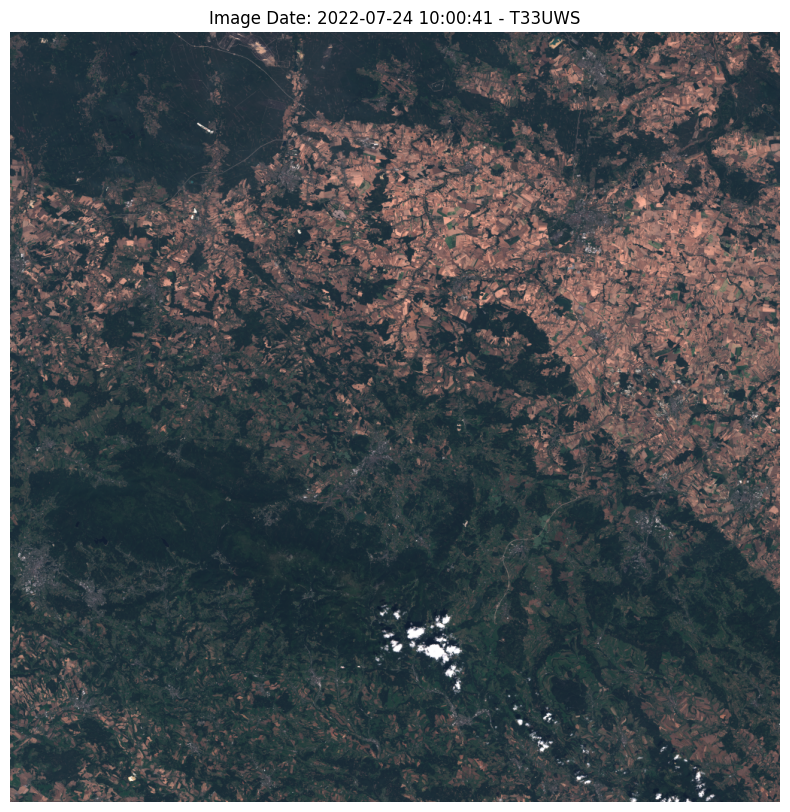

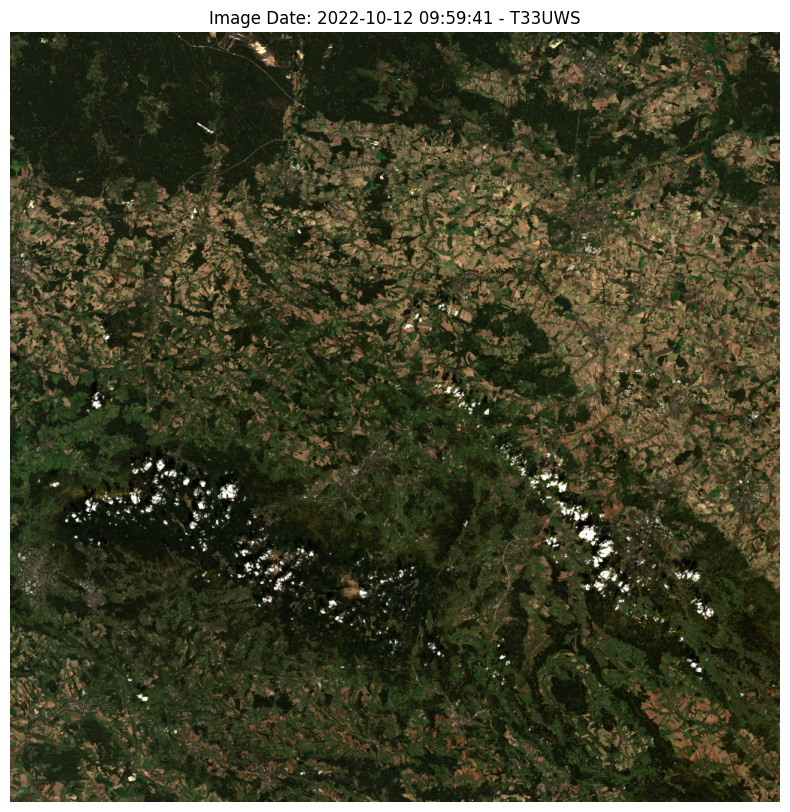

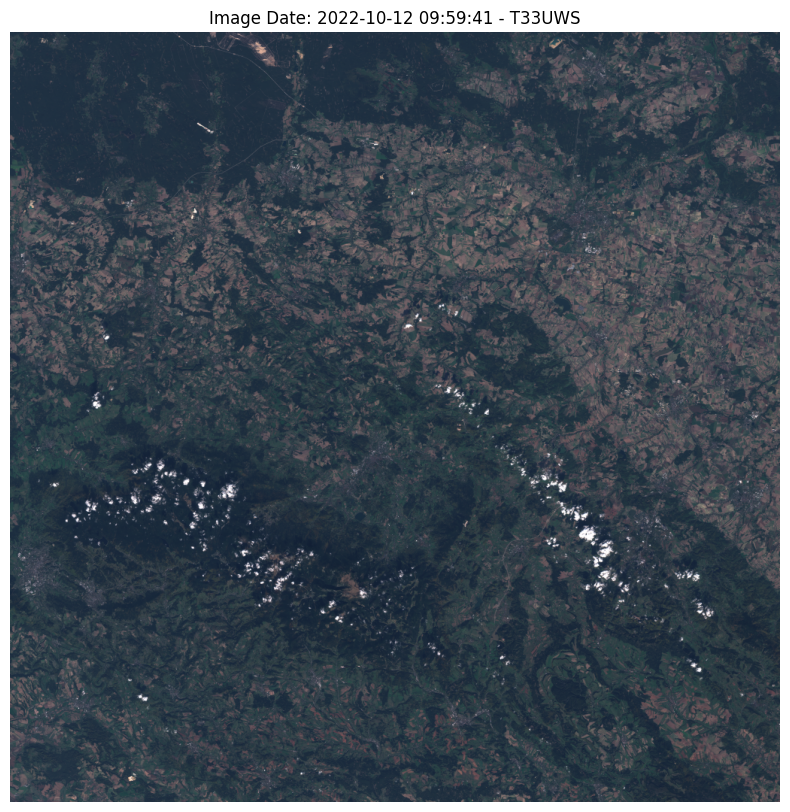

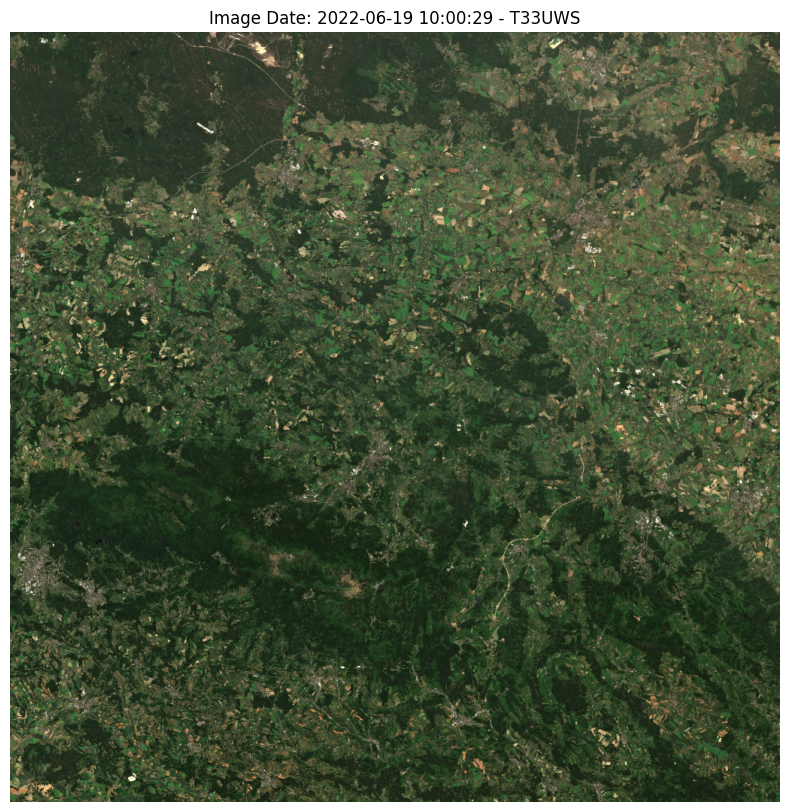

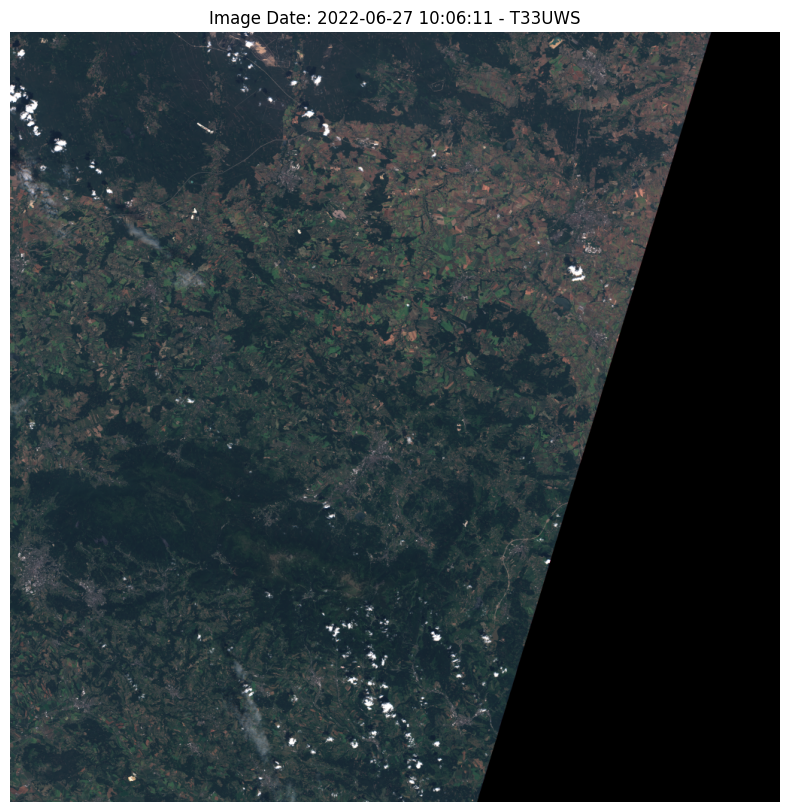

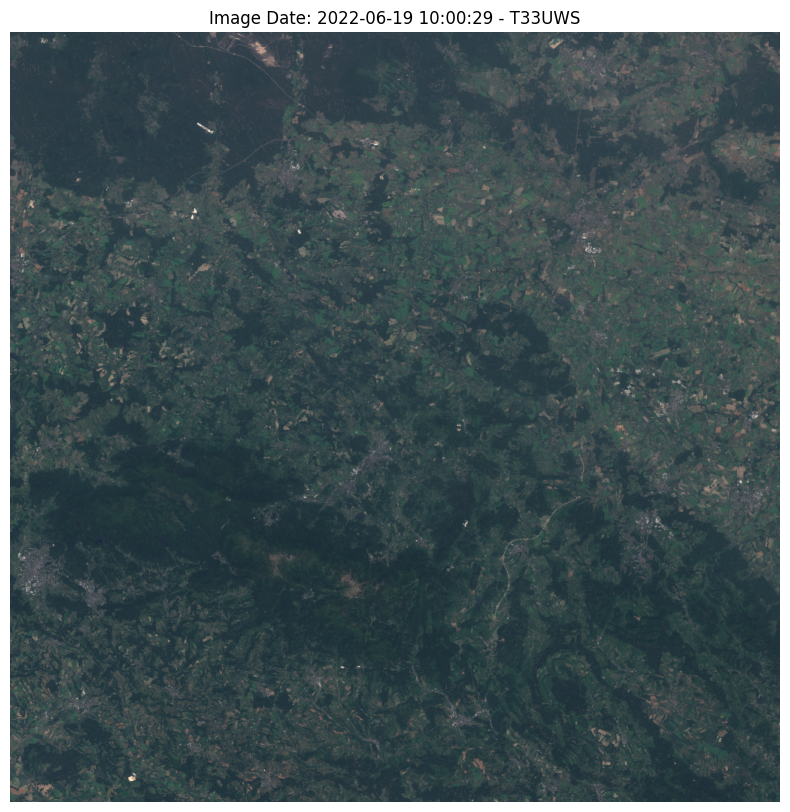

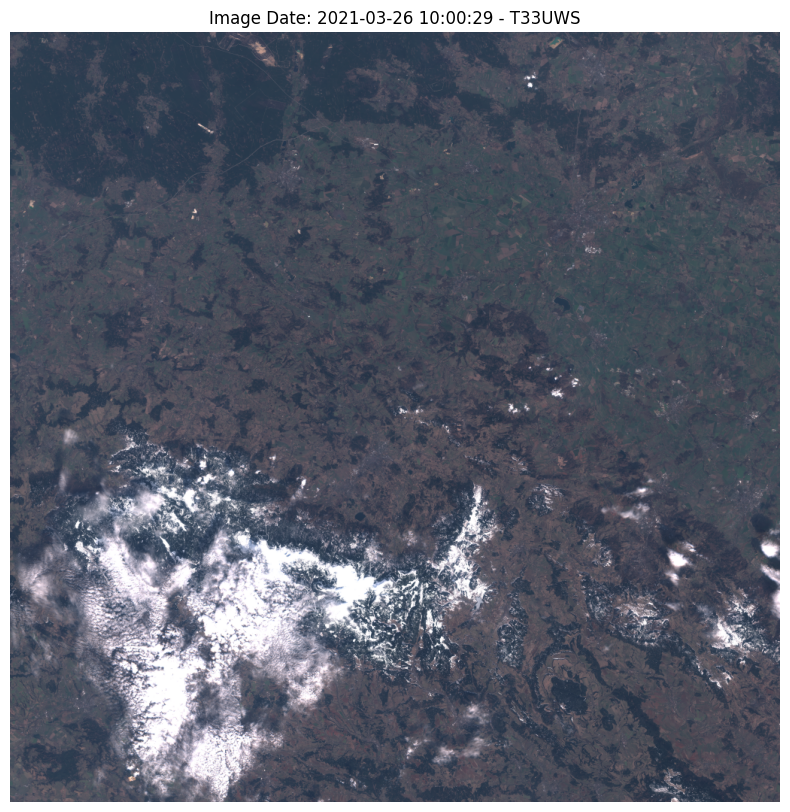

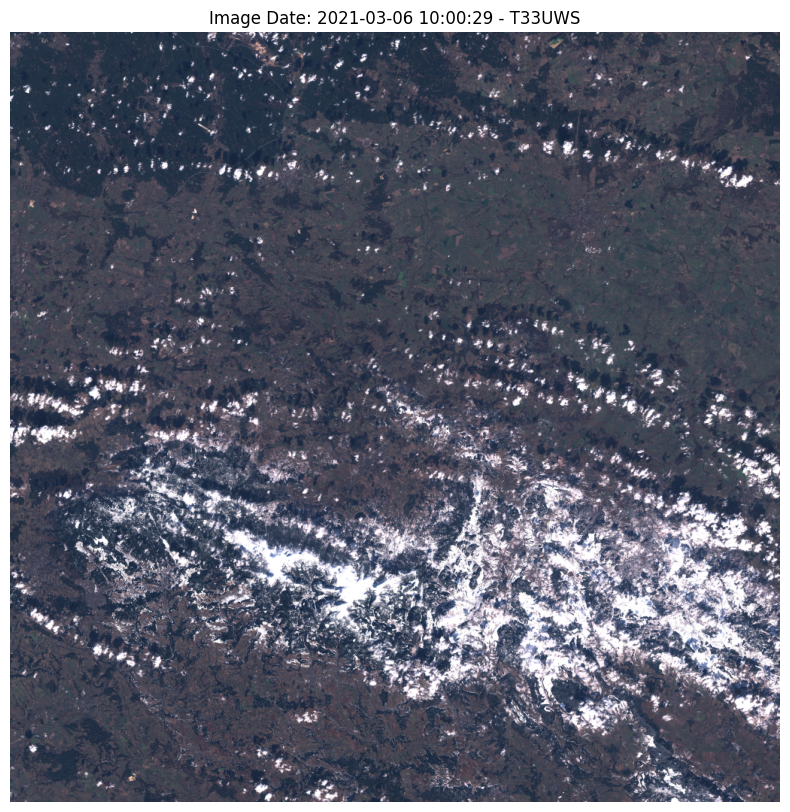

In [8]:
#from utils import filter_images_by_tile
#from utils import load_and_resize_images
#from utils import show_images

directories = ['/home/jovyan/work/satellite_data/v1', '/home/jovyan/work/satellite_data/v2']
specific_tile_code = 'T33UWS'

# Collecting image names that match the specific tile code
img_names = filter_images_by_tile(directories, specific_tile_code)

# Load and resize images, and also get their dates
imgs, dates = load_and_resize_images(directories, img_names)

# Display images with their corresponding dates
show_images(imgs, dates)


In [3]:
import os
import cv2

def load_and_resize_images(directories, filenames, new_size=(1024, 1024)):
    """
    Loads images from a list of filenames in multiple directories, resizes them to the 
    given size, and stores them as NumPy arrays.

    Parameters:
    - directories: A list of directories containing the image files.
    - filenames: A list of filenames to load.
    - new_size: A tuple defining the new image size (width, height).

    Returns:
    - A list of NumPy arrays representing the resized images.
    """
    resized_images = []

    # Iterate over the directories
    for directory in directories:
        # Iterate over the filenames
        for filename in filenames:
            # Construct the full path to the image file
            file_path = os.path.join(directory, filename)

            # Load the image using OpenCV
            image = cv2.imread(file_path, cv2.IMREAD_UNCHANGED)

            # Check if the image was loaded successfully
            if image is not None:
                # Resize the image to the new size
                resized_image = cv2.resize(image, new_size, interpolation=cv2.INTER_AREA)
                resized_images.append(resized_image)
            else:
                print(f"Failed to load image: {file_path}")

    return resized_images


In [2]:
import os

def filter_images_by_tile(directories, tile_code):
    """
    Collects a list of filenames from multiple directories that contain 
    a specific MGRS tile code.

    Parameters:
    - directories: A list of directories containing the image files.
    - tile_code: The MGRS tile code to filter by (e.g., 'T32UPB').

    Returns:
    - A list of filenames that contain the specified MGRS tile code.
    """
    # List to hold the filenames that match the tile_code
    filtered_filenames = []

    # Iterate over each directory
    for directory in directories:
        # Iterate over all files in the given directory
        for filename in os.listdir(directory):
            # Check if the tile_code is part of the filename
            if tile_code in filename:
                filtered_filenames.append(filename)

    return filtered_filenames


In [7]:
import matplotlib.pyplot as plt
import cv2

def show_images(images, dates):
    for i, (image, date) in enumerate(zip(images, dates)):
        plt.figure(figsize=(10, 10))
        plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
        #plt.title(f'Image Date: {date} - Image {i}')
        plt.title(f'Image Date: {date} - T33UWS')
        plt.axis('off')
        plt.show()


In [5]:
import os
import cv2
from datetime import datetime

def extract_date_from_filename(filename):
    # Extracts date from filename given the format 'S2A_MSIL1C_YYYYMMDD...tif'
    date_str = filename.split('_')[2]  # The date is the third part of the filename
    return datetime.strptime(date_str, '%Y%m%dT%H%M%S')  # Extract date in 'YYYYMMDD' format


def load_and_resize_images(directories, filenames, new_size=(1024, 1024)):
    resized_images = []
    dates = []

    for directory in directories:
        for filename in filenames:
            file_path = os.path.join(directory, filename)
            image = cv2.imread(file_path, cv2.IMREAD_UNCHANGED)
            if image is not None:
                resized_image = cv2.resize(image, new_size, interpolation=cv2.INTER_AREA)
                resized_images.append(resized_image)
                # Extract date from filename and append to dates list
                date = extract_date_from_filename(filename)
                dates.append(date)
            else:
                print(f"Failed to load image: {file_path}")

    return resized_images, dates


In [13]:
print(img_names)

['S2A_MSIL1C_20220724T100041_N0400_R122_T33UWS_20220724T120137.tif', 'S2A_MSIL2A_20221012T095941_N0400_R122_T33UWS_20221012T142855.tif', 'S2A_MSIL1C_20221012T095941_N0400_R122_T33UWS_20221012T120015.tif', 'S2B_MSIL2A_20220619T100029_N0400_R122_T33UWS_20220619T114329.tif', 'S2A_MSIL1C_20220627T100611_N0400_R022_T33UWS_20220627T134958.tif', 'S2B_MSIL1C_20220619T100029_N0400_R122_T33UWS_20220619T104419.tif', 'S2B_MSIL1C_20210326T100029_N0209_R122_T33UWS_20210326T120554.tif', 'S2B_MSIL1C_20210306T100029_N0209_R122_T33UWS_20210306T121335.tif']


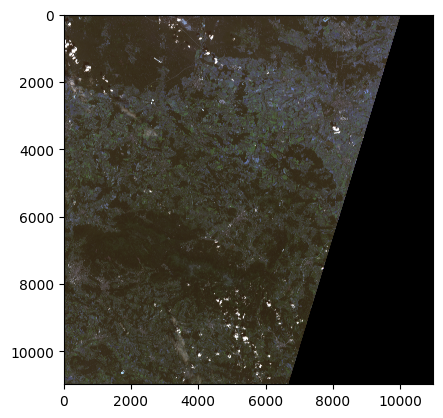

In [18]:
path = '/home/jovyan/work/satellite_data/v2/S2A_MSIL1C_20220627T100611_N0400_R022_T33UWS_20220627T134958.tif'
new_size = (1024, 1024)
image = cv2.imread(path, cv2.IMREAD_UNCHANGED)
image.shape
resized_image = cv2.resize(image, new_size, interpolation=cv2.INTER_AREA)
plt.imshow(image)

In [21]:
import numpy as np
from PIL import Image
import os

def split_and_save_image(image_path, output_dir, tile_size=(256, 256), threshold=0):
    # Bild laden
    image = Image.open(image_path)
    image_np = np.array(image)
    
    # Verzeichnis erstellen, falls noch nicht vorhanden
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)
    
    # Höhe und Breite des Bildes
    height, width, _ = image_np.shape
    # Zähler für die Nummerierung der gespeicherten Kacheln
    saved_tiles = 0
    
    for row in range(0, height, tile_size[0]):
        for col in range(0, width, tile_size[1]):
            # Extrahiere die Kachel
            tile = image_np[row:row+tile_size[0], col:col+tile_size[1]]
            
            # Prüfe, ob die Kachel schwarze Pixel enthält
            if np.any(tile > threshold):  # Non-zero pixel threshold
                # Speichere die Kachel als Bild
                tile_image = Image.fromarray(tile)
                tile_image.save(os.path.join(output_dir, f'tile_{saved_tiles}.png'))
                saved_tiles += 1
                
    return saved_tiles  # Anzahl der gespeicherten Kacheln

# Setzen Sie den Pfad zum Bild und den Ausgabeordner
image_path = '/home/jovyan/work/satellite_data/v2/S2A_MSIL1C_20220627T100611_N0400_R022_T33UWS_20220627T134958.tif'  # Ihr Bildpfad
output_dir = '/home/jovyan/work/saved_data/simg-benchmark/'  # Ihr Ausgabeordner

# Funktion aufrufen
num_saved_tiles = split_and_save_image(image_path, output_dir, (2745, 2745), 100)
print(f"Es wurden {num_saved_tiles} Kacheln gespeichert.")


/usr/local/lib/python3.8/dist-packages/PIL/Image.py:3176: DecompressionBombWarning: Image size (120560400 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(


Es wurden 15 Kacheln gespeichert.


Originalbildgröße: (10980, 10980, 3)


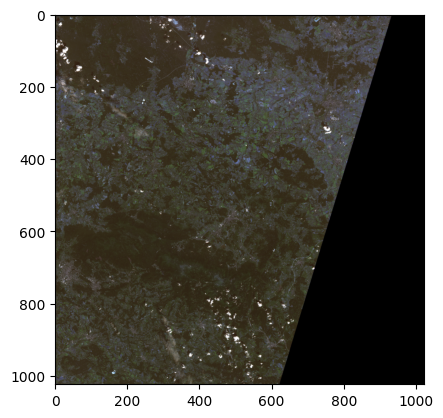

In [20]:
import cv2
import matplotlib.pyplot as plt

# Pfad zur Bilddatei
path = '/home/jovyan/work/satellite_data/v2/S2A_MSIL1C_20220627T100611_N0400_R022_T33UWS_20220627T134958.tif'

# Bild mit OpenCV einlesen
image = cv2.imread(path, cv2.IMREAD_UNCHANGED)

# Überprüfen, ob das Bild erfolgreich geladen wurde
if image is not None:
    # Bildgröße ausgeben
    print(f'Originalbildgröße: {image.shape}')
    
    # Bildgröße ändern
    resized_image = cv2.resize(image, (1024, 1024), interpolation=cv2.INTER_AREA)
    
    # Bild anzeigen
    plt.imshow(resized_image)
    plt.show()
else:
    print("Das Bild konnte nicht geladen werden. Überprüfen Sie den Dateipfad und die Dateiintegrität.")


In [22]:
import numpy as np
from PIL import Image
import os

def split_and_save_image(image_path, output_dir, tile_size=(256, 256), threshold=0):
    # Bild laden
    image = Image.open(image_path)
    image_np = np.array(image)
    
    # Verzeichnis erstellen, falls noch nicht vorhanden
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)
    
    # Höhe und Breite des Bildes bestimmen
    height, width = image_np.shape[:2]
    # Zähler für die Nummerierung der gespeicherten Kacheln
    saved_tiles = 0
    
    # Bild in Kacheln aufteilen und speichern
    for row in range(0, height, tile_size[0]):
        for col in range(0, width, tile_size[1]):
            # Kachel ausschneiden
            tile = image_np[row:row + tile_size[0], col:col + tile_size[1]]
            
            # Prüfen, ob die Kachel schwarze Pixel enthält
            if tile.size == 0 or np.mean(tile, axis=(0, 1)) > threshold:
                # Kachel speichern
                tile_image = Image.fromarray(tile)
                tile_image.save(os.path.join(output_dir, f'tile_{saved_tiles}.png'))
                saved_tiles += 1

    return saved_tiles

# Pfade anpassen
image_path = '/home/jovyan/work/satellite_data/v2/S2A_MSIL1C_20220627T100611_N0400_R022_T33UWS_20220627T134958.tif'  # Pfad zum Bild
output_dir = '/home/jovyan/work/saved_data/simg-benchmark/'  # Ausgabeordner

# Funktion aufrufen
num_saved_tiles = split_and_save_image(image_path, output_dir, (1024, 1024), 50)
print(f"Anzahl der gespeicherten Kacheln: {num_saved_tiles}")


ValueError: The truth value of an array with more than one element is ambiguous. Use a.any() or a.all()

In [ ]:
import numpy as np
from PIL import Image
import os

def split_and_save_image(image_path, output_dir, tile_size=(256, 256), threshold=0):
    # Bild laden
    image = Image.open(image_path)
    image_np = np.array(image)
    image_np.shape
    
    # Verzeichnis erstellen, falls noch nicht vorhanden
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)
    
    # Höhe und Breite des Bildes bestimmen
    height, width = image_np.shape[:2]
    # Zähler für die Nummerierung der gespeicherten Kacheln
    saved_tiles = 0
    
    # Bild in Kacheln aufteilen und speichern
    for row in range(0, height, tile_size[0]):
        for col in range(0, width, tile_size[1]):
            # Kachel ausschneiden
            tile = image_np[row:row + tile_size[0], col:col + tile_size[1]]
            zero_pixels = np.sum(tile == 0)
            print(zero_pixels)
            
            # Überprüfen, ob die Kachel die Mindestanzahl von nicht schwarzen Pixeln enthält
            if zero_pixels == 0:  # Prüfen auf nicht-schwarze Pixel
                # Überprüfen, ob die Kachel die volle Größe hat (für Kantenkacheln)
                if tile.shape[0] == tile_size[0] and tile.shape[1] == tile_size[1]:
                    # Kachel speichern, wenn nicht alle Pixel schwarz sind
                    tile_image = Image.fromarray(tile)
                    tile_image.save(os.path.join(output_dir, f'tile_{saved_tiles}.png'))
                    saved_tiles += 1

    return saved_tiles

# Pfade anpassen
image_path = '/home/jovyan/work/satellite_data/v2/S2A_MSIL1C_20220627T100611_N0400_R022_T33UWS_20220627T134958.tif'  # Pfad zum Bild
output_dir = '/home/jovyan/work/saved_data/simg-benchmark/'  # Ausgabeordner

# Funktion aufrufen
num_saved_tiles = split_and_save_image(image_path, output_dir, (2745, 2745), 0)
print(f"Anzahl der gespeicherten Kacheln: {num_saved_tiles}")


In [ ]:
path = '/home/jovyan/work/satellite_data/v2/S2A_MSIL1C_20220627T100611_N0400_R022_T33UWS_20220627T134958.tif'
image = Image.open(image_path)
image_np = np.array(image)
print(image_np)

/home/jovyan/work/saved_data/HAT/datasets/SI3gt/S2B_MSIL2A_20220906T102559_N0400_R108_T32UMB_20220906T131726.tif_crop_14_9.png
/home/jovyan/work/saved_data/HAT/datasets/SI3gt/S2B_MSIL1C_20220930T100729_N0400_R022_T33UVV_20220930T121519.tif_crop_0_9.png
/home/jovyan/work/saved_data/HAT/datasets/SI3gt/S2B_MSIL2A_20200326T104639_N0214_R051_T31UFU_20200326T141923.tif_crop_7_1.png
/home/jovyan/work/saved_data/HAT/datasets/SI3gt/S2B_MSIL1C_20220930T100729_N0400_R022_T33UVU_20220930T121519.tif_crop_16_7.png
/home/jovyan/work/saved_data/HAT/datasets/SI3gt/S2B_MSIL1C_20220731T103629_N0400_R008_T31UFQ_20220731T112305.tif_crop_15_8.png
/home/jovyan/work/saved_data/HAT/datasets/SI3gt/S2B_MSIL2A_20220807T102559_N0400_R108_T31UGQ_20220807T132122.tif_crop_18_10.png
/home/jovyan/work/saved_data/HAT/datasets/SI3gt/S2B_MSIL1C_20220611T103629_N0400_R008_T32ULG_20220611T112149.tif_crop_6_8.png
/home/jovyan/work/saved_data/HAT/datasets/SI3gt/S2A_MSIL1C_20220623T103031_N0400_R108_T32UPG_20220623T141109.tif_

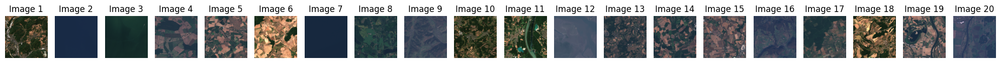

In [11]:
import os
import matplotlib.pyplot as plt
from PIL import Image

def plot_first_n_images(directory, n=10):
    """
    Plots the first n images in a directory.

    Parameters:
    - directory: Path to the directory containing the images.
    - n: Number of images to plot.
    """
    # Get all files in the directory
    files = os.listdir(directory)
    
    # Filter out files that are not images
    image_files = [f for f in files if f.lower().endswith(('.png', '.jpg', '.jpeg', '.tiff', '.bmp', '.gif'))]
    
    # Plot the first n images
    fig, axes = plt.subplots(1, n, figsize=(20, 10))  # Adjust the figure size as necessary
    for i, file in enumerate(image_files[:n]):
        # Load image
        img_path = os.path.join(directory, file)
        print(img_path)
        image = Image.open(img_path)
        
        # Plot image
        ax = axes[i] if n > 1 else axes
        ax.imshow(image)
        ax.axis('off')
        ax.set_title(f'Image {i+1}')
    
    plt.tight_layout()
    plt.show()

# Example usage:
# Replace '/path/to/images' with the actual path to your directory of images
plot_first_n_images('/home/jovyan/work/saved_data/HAT/datasets/SI3gt', n=20)


In [8]:
image_gt = cv2.imread("/home/jovyan/work/saved_data/HAT/datasets/SI3gt/S2B_MSIL2A_20220906T102559_N0400_R108_T32UMB_20220906T131726.tif_crop_14_9.png", cv2.IMREAD_UNCHANGED)
image_lq = cv2.imread("/home/jovyan/work/saved_data/HAT/datasets/SI3lq/S2B_MSIL2A_20220906T102559_N0400_R108_T32UMB_20220906T131726.tif_crop_14_9.png", cv2.IMREAD_UNCHANGED)

In [14]:
import os
import shutil

def copy_files_to_folder(file_paths, target_folder):
    """
    Copies the specified files to the target folder.

    :param file_paths: A list of the full paths to the files to be copied.
    :param target_folder: The path to the target folder where the files will be copied.
    """
    # Create the target folder if it does not exist
    if not os.path.exists(target_folder):
        os.makedirs(target_folder)

    # Copy each file
    for file_path in file_paths:
        if os.path.isfile(file_path):
            shutil.copy(file_path, target_folder)
        else:
            print(f"File not found: {file_path}")

# List of file paths
file_paths = [
    "/home/jovyan/work/saved_data/HAT/datasets/SI3lq/S2B_MSIL2A_20220906T102559_N0400_R108_T32UMB_20220906T131726.tif_crop_14_9.png",
    "/home/jovyan/work/saved_data/HAT/datasets/SI3lq/S2B_MSIL1C_20220731T103629_N0400_R008_T31UFQ_20220731T112305.tif_crop_15_8.png",
    "/home/jovyan/work/saved_data/HAT/datasets/SI3lq/S2A_MSIL1C_20220812T103031_N0400_R108_T32UMV_20220812T155113.tif_crop_1_10.png",
    "/home/jovyan/work/saved_data/HAT/datasets/SI3lq/S2A_MSIL2A_20220812T103031_N0400_R108_T32UMB_20220812T182800.tif_crop_12_7.png",
    "/home/jovyan/work/saved_data/HAT/datasets/SI3lq/S2B_MSIL2A_20220708T102559_N0400_R108_T32ULU_20220708T131740.tif_crop_7_19.png"
    # Add more paths here...
]

target_folder = "/home/jovyan/work/saved_data/HAT/datasets/Sat2/Sat2Lq"  # Set your target folder path here

# Call the function
copy_files_to_folder(file_paths, target_folder)
